In [219]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import subprocess

In [220]:
# Run the data generation script
subprocess.run(["pip", "install", "-r", "requirements.txt"])
subprocess.run(["g++", "-o", "fourier", "fourier.cpp", "-lm"])
subprocess.run(["./fourier"])

CompletedProcess(args=['./fourier'], returncode=0)

In [221]:
csv_file = []
for file in os.listdir():
    if file.endswith(".csv"):
        csv_file.append(file)
        print(file)


trajectory_position.csv
PID1.csv
inverted_trajectory_component.csv
alternative_kalman2.csv
luenberger2.csv
alternative_kalman1.csv
inverted_trajectory_position.csv
kalman2.csv
extended_kalman1.csv
trajectory_component.csv
kalman1.csv
PID2.csv
luenberger1.csv
extended_kalman2.csv
LQR1.csv
LQR2.csv


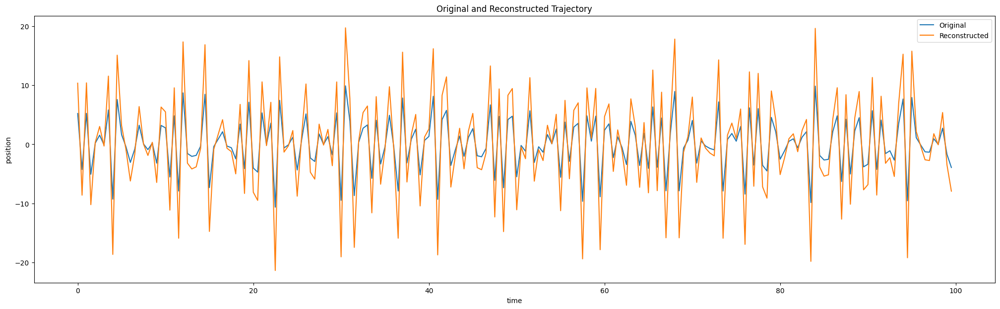

In [222]:
trajectory = pd.read_csv("trajectory_position.csv")
inverted_trajectory = pd.read_csv("inverted_trajectory_position.csv")

# plot in a figure size x=25, y=7
fig = plt.figure(figsize=(25, 7))
plt.plot(trajectory["time"], trajectory["position"])
plt.plot(inverted_trajectory["time"], inverted_trajectory["position"])
plt.xlabel("time")
plt.ylabel("position")
plt.title("Original and Reconstructed Trajectory")
plt.legend(["Original", "Reconstructed"])
plt.show()

In [223]:
# Combine trajectory and inverted trajectory dataframes with unique headers
trajectory_component = pd.read_csv("trajectory_component.csv")
inverted_trajectory_component = pd.read_csv("inverted_trajectory_component.csv")

# convert to table
trajectory_component = trajectory_component.pivot_table(index="n", values=["angular_velocity", "amplitude", "phase"])
inverted_trajectory_component = inverted_trajectory_component.pivot_table(index="n", values=["angular_velocity", "amplitude", "phase"])

trajectory_component

,amplitude,angular_velocity,phase
n,,,
0,1.772880,4.01133,2.358700
1,1.710150,-4.10209,7.574890
2,0.092358,2.62897,0.404382
3,3.689570,-7.49325,1.342110
4,0.683352,-7.44128,8.214990
5,2.624400,2.70078,5.331070
6,1.980520,-8.68579,0.251707
7,3.430090,6.80479,0.613498
8,0.228008,-3.64948,1.301790


In [224]:
inverted_trajectory_component

,amplitude,angular_velocity,phase
n,,,
0,0.158980,0.000000,0.000000
1,0.121924,0.062832,-1.003840
2,0.202762,0.125664,0.788612
3,0.187484,0.188496,-0.017595
4,0.089462,0.251327,1.253680
5,0.048042,0.314159,1.260630
6,0.174884,0.376991,2.648360
7,0.037343,0.439823,2.177470
8,0.281176,0.502655,-2.499390


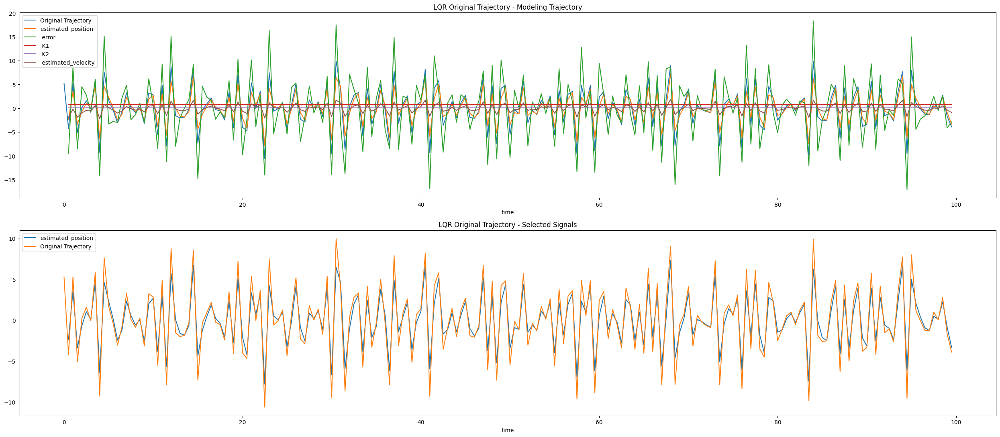

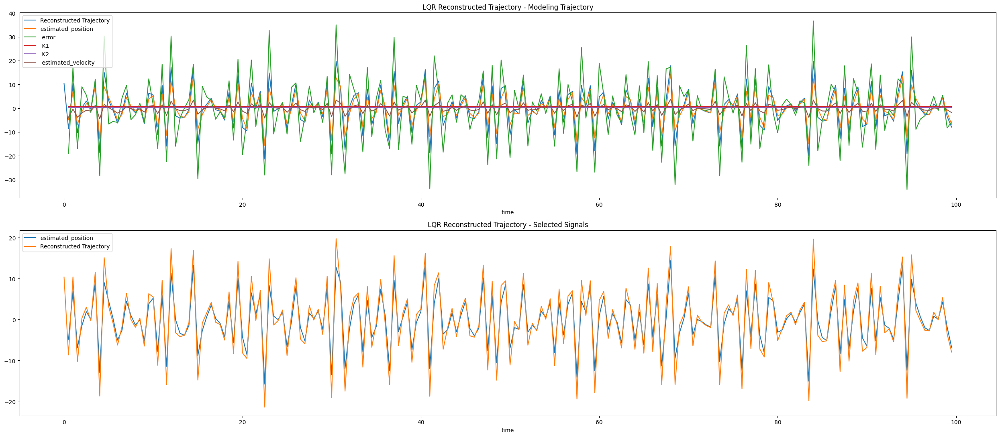

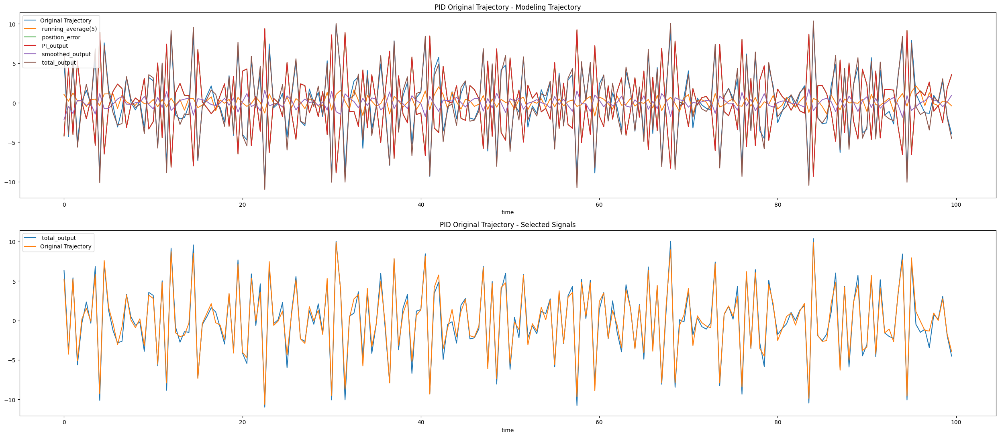

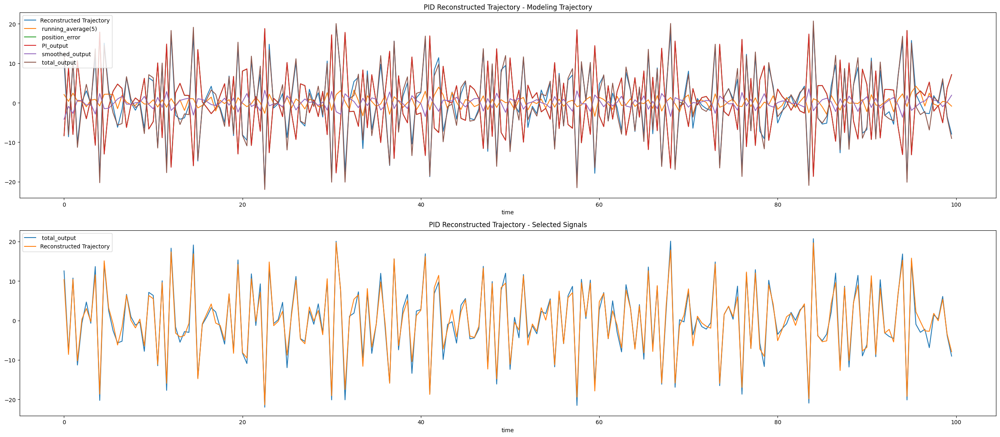

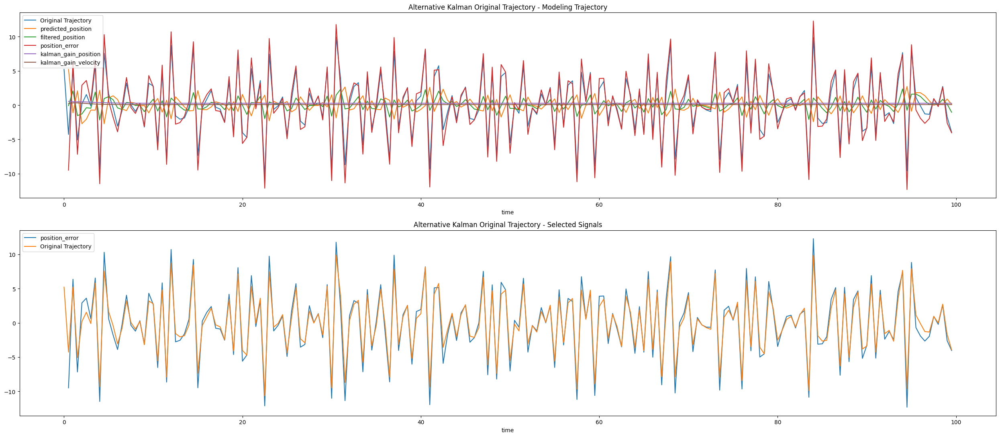

...

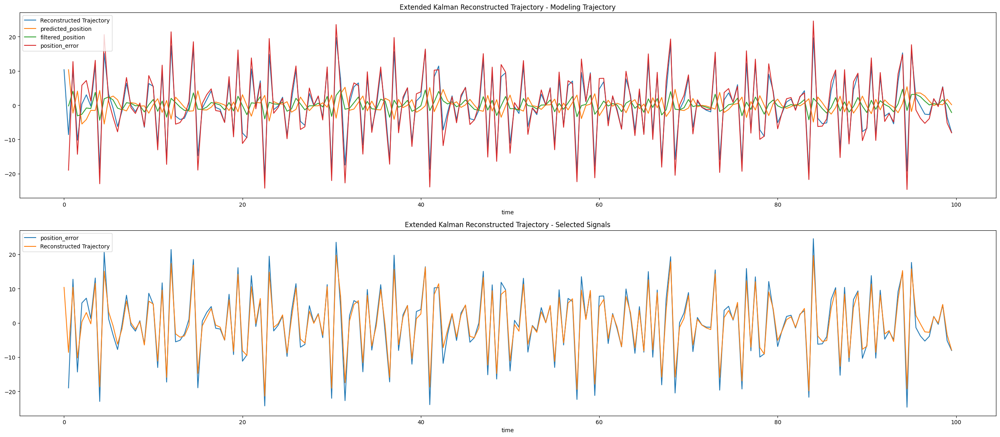

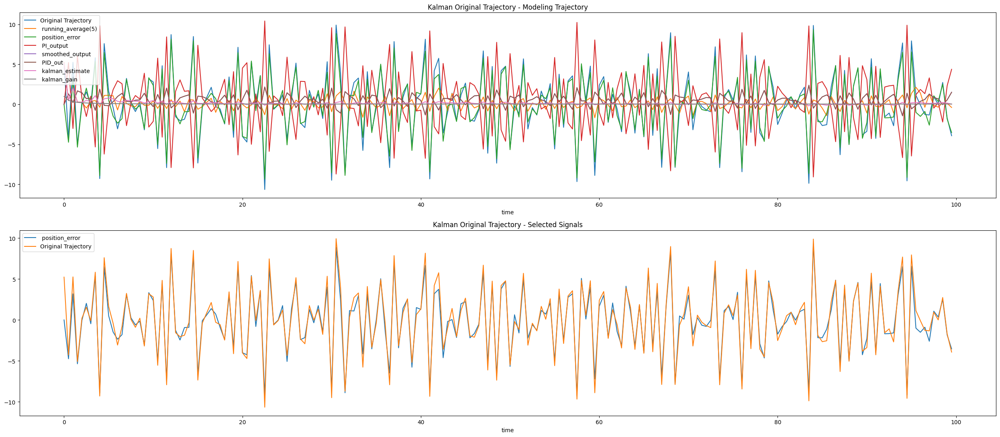

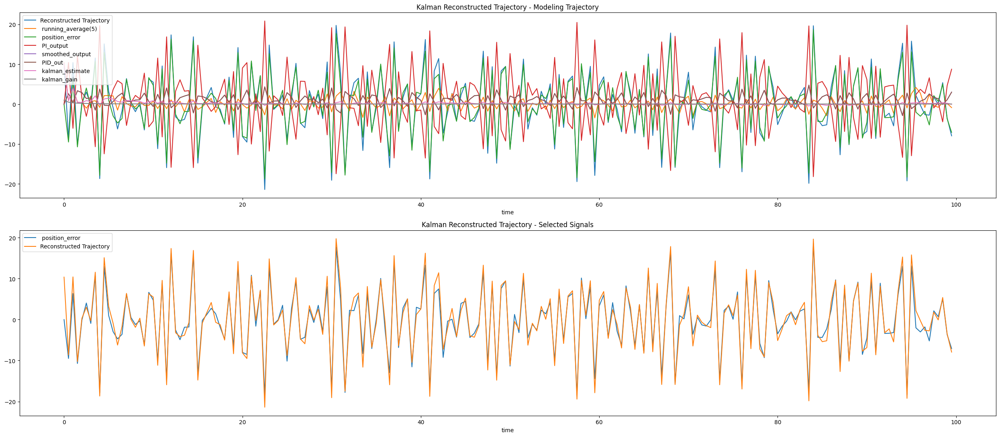

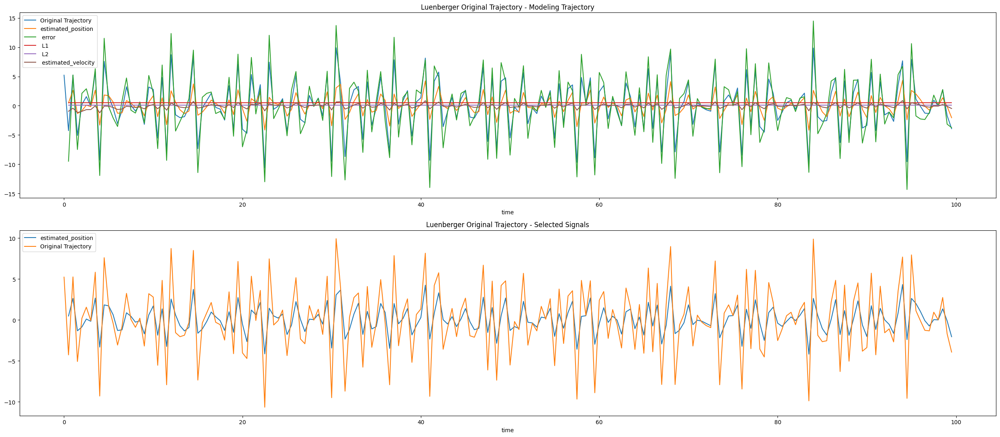

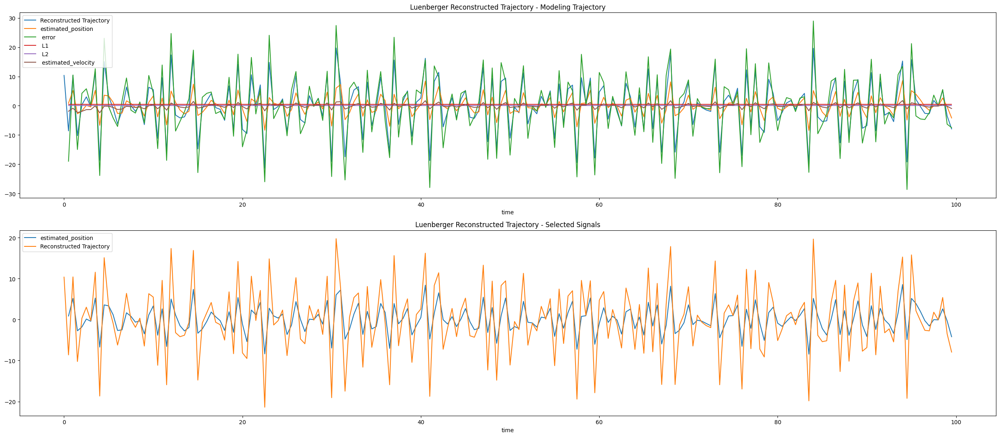

In [ ]:
for file in sorted(csv_file):
    if file.endswith("_component.csv") or file.endswith("_position.csv"):
        continue

    df = pd.read_csv(file)
    headers = list(df.columns)[1:]

    has_measured = "measured_position" in headers
    if has_measured:
        headers.remove("measured_position")
    
    # Title formatting
    terms = file.split(".")[0].split("_")
    title = " ".join(terms)
    last_char = title[-1]
    title = title[:-1]
    if not (title == 'PID' or title == 'LQR'):
        title = title.title()

    # Create subplots
    fig, (ax1, ax2) = plt.subplots(figsize=(25, 11), ncols=1, nrows=2)

    # Subplot 1: Full trajectory and model estimates
    if last_char == "1":
        ax1.plot(trajectory["time"], trajectory["position"], label="Original Trajectory")
        title += " Original Trajectory"
    elif last_char == "2":
        ax1.plot(inverted_trajectory["time"], inverted_trajectory["position"], label="Reconstructed Trajectory")
        title += " Reconstructed Trajectory"

    for header in headers:
        ax1.plot(df["time"], df[header], label=header)

    ax1.set_xlabel("time")
    ax1.set_title(title + " - Modeling Trajectory")
    ax1.legend(loc="upper left")

    # Subplot 2: Selected signal(s)
    selected_headers = []
    if "PID" in title:
        selected_headers = [col for col in df.columns if "total_output" in col]
    elif "Kalman" in title:
        selected_headers = [col for col in df.columns if "error" in col]
    elif "LQR" in title:
        selected_headers = [col for col in df.columns if any(k in col for k in ["estimated_position"])]
    elif "Luenberger" in title:
        selected_headers = [col for col in df.columns if any(k in col for k in ["estimated_position", "error"])]

    for header in selected_headers:
        ax2.plot(df["time"], df[header], label=header)

    if last_char == "1":
        ax2.plot(trajectory["time"], trajectory["position"], label="Original Trajectory")
    elif last_char == "2":
        ax2.plot(inverted_trajectory["time"], inverted_trajectory["position"], label="Reconstructed Trajectory")

    ax2.set_xlabel("time")
    ax2.set_title(title + " - Selected Signals")
    ax2.legend(loc="upper left")

    # Layout and show
    plt.tight_layout()
    plt.show()
